# Colourspace read/write tests

This notebook explores changing colourspace by assuming an input image is in one colourspace defined by R, G, B and White point chromaticities, converts these to absolute CIE XYZ colour space, then converts them to a finaly display colourspace defined by different R, G, B and White point chromaticities. 

Inputs and outputs can be completely different.  Common use case would be reading in video data in from a strange/unique/bespoke colour system / white point, and converting them out to something common like BT.709 or BT.2020 with D65 white point while keeping the intent of the original system. 

Reference maths here:
* http://www.brucelindbloom.com/Eqn_RGB_XYZ_Matrix.html

Included in the list is is sRGB to XYZ, which is identical to BT.709 to XYZ.

Missing is BT.601-525 (480i/240p), BT.601-625 (576i/288p), or "NTSC-J ARIB". 

For this notebook to work, you'll need to do something like:

<code>pip3 install --user --break-system-packages jupyter numpy Pillow</code>

In [1]:
# Use "numpy" for all of our array / matrix maths
import numpy as np

In [2]:
'''
All values in this cell copy/pasted from:
http://www.brucelindbloom.com/Eqn_ChromAdapt.html
'''

#Standard illuminatnt D50 XYZ co-ordinates
D50_XYZ=([0.96422, 1.00000, 0.82521])

#Standard illuminatnt D55 XYZ co-ordinates
D55_XYZ = np.array([0.95682, 1.00000, 0.92149])

#Standard illuminant D65 XYZ co-ordinates
D65_XYZ = np.array([0.95047, 1.00000, 1.08883])

#Standard illuminant D75 XYZ co-ordinates
D75_XYZ = np.array([0.94972, 1.00000, 1.226380])

#Reshaped arrays, taking horiz XYZ co-ords and making a vertical matrix
D50_XYZ_vert = np.reshape(D50_XYZ, (3,1))
D55_XYZ_vert = np.reshape(D55_XYZ, (3,1))
D65_XYZ_vert = np.reshape(D65_XYZ, (3,1))
D75_XYZ_vert = np.reshape(D75_XYZ, (3,1))

# Bradford Adaptation according to website
Bradford = np.array([[0.8951000, 0.2664000, -0.1614000],
                     [-0.7502000, 1.7135000, 0.0367000],
                     [0.0389000, -0.0685000, 1.0296000]])

# Inverse Bradford Adaptation according to website
BradfordInv = np.array([[0.9869929, -0.1470543, 0.1599627],
                        [0.4323053, 0.5183603, 0.0492912],
                        [-0.0085287, 0.0400428, 0.9684867]])

# Website documented resulting adaptation matrices for us to compare to later
D65_to_D50_XYZ_Lindbloom = np.array([[1.0144665, 0.0000000, 0.0000000],
                                     [0.0000000, 1.0000000, 0.0000000],
                                     [0.0000000, 0.0000000, 0.7578869]])

D65_to_D55_XYZ_Lindbloom = np.array([[1.0066809, 0.0000000, 0.0000000],
                                     [0.0000000, 1.0000000, 0.0000000],
                                     [0.0000000, 0.0000000, 0.8463121]])

D65_to_D75_XYZ_Lindbloom = np.array([[0.9992109, 0.0000000, 0.0000000],
                                     [0.0000000, 1.0000000, 0.0000000],
                                     [0.0000000, 0.0000000, 1.1263283]])

D65_to_D50_Bradford_Lindbloom = np.array([[1.0478112, 0.0228866, -0.0501270],
                                          [0.0295424, 0.9904844, -0.0170491],
                                          [-0.0092345, 0.0150436, 0.7521316]])

D65_to_D55_Bradford_Lindbloom = np.array([[1.0285405, 0.0135022, -0.0314825],
                                          [0.0172109, 0.9952227, -0.0106363],
                                          [-0.0058993, 0.0096778, 0.8425735]])

D65_to_D75_Bradford_Lindbloom = np.array([[0.9799401, -0.0091708, 0.0252447],
                                          [-0.0112490, 1.0015532, 0.0083931],
                                          [0.0049195, -0.0081963, 1.1295615]])


In [3]:
## Checking our maths vs Lindbloom's values
# XYZ conversions
# forumulas here: http://www.brucelindbloom.com/Eqn_ChromAdapt.html
# Destination/Source with identity matrix section skipped
D65_to_D50_XYZ = np.diag(D50_XYZ/D65_XYZ)
D65_to_D55_XYZ = np.diag(D55_XYZ/D65_XYZ)
D65_to_D75_XYZ = np.diag(D75_XYZ/D65_XYZ)

In [4]:
# Numpy "isclose" compares two matricies, prints "True" for each element if close to specified accuracy
# Some values are truncated on documented website, so "isclose" used instead of "equal"
print("D65_to_D50 match: \n", np.isclose(D65_to_D50_XYZ, D65_to_D50_XYZ_Lindbloom, 1e-5), "\n")
print("D65_to_D55 match: \n", np.isclose(D65_to_D55_XYZ, D65_to_D55_XYZ_Lindbloom, 1e-5), "\n")
print("D65_to_D75 match: \n", np.isclose(D65_to_D75_XYZ, D65_to_D75_XYZ_Lindbloom, 1e-5), "\n")


D65_to_D50 match: 
 [[ True  True  True]
 [ True  True  True]
 [ True  True  True]] 

D65_to_D55 match: 
 [[ True  True  True]
 [ True  True  True]
 [ True  True  True]] 

D65_to_D75 match: 
 [[ True  True  True]
 [ True  True  True]
 [ True  True  True]] 



In [5]:
## Checking our maths vs Lindbloom's values
# Bradford Adaptation matricies applied
# Forumlas here: http://www.brucelindbloom.com/Eqn_ChromAdapt.html

# CRD = "Cone Response Domain", i.e.: "(ρ, γ, β)" documented on the website
D50_CRD = np.matmul(Bradford, D50_XYZ_vert)
D55_CRD = np.matmul(Bradford, D55_XYZ_vert)
D65_CRD = np.matmul(Bradford, D65_XYZ_vert)
D75_CRD = np.matmul(Bradford, D75_XYZ_vert)

#D50
D65_to_D50_CRD_1 = np.diag(np.reshape((D50_CRD/D65_CRD), 3))
D65_to_D50_CRD_2 = np.matmul(BradfordInv, D65_to_D50_CRD_1)
D65_to_D50_Bradford_calc = np.matmul(D65_to_D50_CRD_2, Bradford)

#D55
D65_to_D55_CRD_1 = np.diag(np.reshape((D55_CRD/D65_CRD), 3))
D65_to_D55_CRD_2 = np.matmul(BradfordInv, D65_to_D55_CRD_1)
D65_to_D55_Bradford_calc = np.matmul(D65_to_D55_CRD_2, Bradford)

#D75
D65_to_D75_CRD_1 = np.diag(np.reshape((D75_CRD/D65_CRD), 3))
D65_to_D75_CRD_2 = np.matmul(BradfordInv, D65_to_D75_CRD_1)
D65_to_D75_Bradford_calc = np.matmul(D65_to_D75_CRD_2, Bradford)


In [6]:
# Numpy "isclose" compares two matricies, prints "True" for each element if close to specified accuracy
# Some values are truncated on documented website, so "isclose" used instead of "equal"
print("D65_to_D50 match: \n", np.isclose(D65_to_D50_Bradford_calc, D65_to_D50_Bradford_Lindbloom, 1e-4), "\n")
print("D65_to_D55 match: \n", np.isclose(D65_to_D55_Bradford_calc, D65_to_D55_Bradford_Lindbloom, 1e-4), "\n")
print("D65_to_D75 match: \n", np.isclose(D65_to_D75_Bradford_calc, D65_to_D75_Bradford_Lindbloom, 1e-4), "\n")


D65_to_D50 match: 
 [[ True  True  True]
 [ True  True  True]
 [ True  True  True]] 

D65_to_D55 match: 
 [[ True  True  True]
 [ True  True  True]
 [ True  True  True]] 

D65_to_D75 match: 
 [[ True  True  True]
 [ True  True  True]
 [ True  True  True]] 



In [7]:
# Wikipedia values, xyY for standard D illuminants
# https://en.wikipedia.org/wiki/Standard_illuminant
D50_xyY_2deg = np.array([0.34567, 0.35850])
D55_xyY_2deg = np.array([0.33242, 0.34743])
D65_xyY_2deg = np.array([0.31271, 0.32902])
D75_xyY_2deg = np.array([0.29902, 0.31485])

# xyY to XYZ
# http://www.brucelindbloom.com/Eqn_xyY_to_XYZ.html
# Y normalised to 1.0000 for all

# D50
D50_X = D50_xyY_2deg[0]/D50_xyY_2deg[1]
D50_Z = (1 - D50_xyY_2deg[0] - D50_xyY_2deg[1])/D50_xyY_2deg[1]
D50_XYZ_calc = np.array([D50_X, 1.0000, D50_Z])

# D55
D55_X = D55_xyY_2deg[0]/D55_xyY_2deg[1]
D55_Z = (1 - D55_xyY_2deg[0] - D55_xyY_2deg[1])/D55_xyY_2deg[1]
D55_XYZ_calc = np.array([D55_X, 1.0000, D55_Z])

# D65
D65_X = D65_xyY_2deg[0]/D65_xyY_2deg[1]
D65_Z = (1 - D65_xyY_2deg[0] - D65_xyY_2deg[1])/D65_xyY_2deg[1]
D65_XYZ_calc = np.array([D65_X, 1.0000, D65_Z])

# D75
D75_X = D75_xyY_2deg[0]/D75_xyY_2deg[1]
D75_Z = (1 - D75_xyY_2deg[0] - D75_xyY_2deg[1])/D75_xyY_2deg[1]
D75_XYZ_calc = np.array([D75_X, 1.0000, D75_Z])

In [8]:
# Numpy "isclose" compares two matricies, prints "True" for each element if close to specified accuracy
# Some values are truncated on documented website, so "isclose" used instead of "equal"
print("D50 calc XYZ match: ", np.isclose(D50_XYZ_calc, D50_XYZ, 1e-4), "\n")
print("D55 calc XYZ match: ", np.isclose(D55_XYZ_calc, D55_XYZ, 1e-4), "\n")
print("D65 calc XYZ match: ", np.isclose(D65_XYZ_calc, D65_XYZ, 1e-4), "\n")
print("D75 calc XYZ match: ", np.isclose(D75_XYZ_calc, D75_XYZ, 1e-4), "\n")


D50 calc XYZ match:  [ True  True  True] 

D55 calc XYZ match:  [ True  True  True] 

D65 calc XYZ match:  [ True  True  True] 

D75 calc XYZ match:  [ True  True  True] 



In [9]:
# Test wikipedia chromaticity co-ords against calculated
# http://www.brucelindbloom.com/index.html?Eqn_T_to_xy.html
def K_to_xy(T):
  if T < 7000:
      x = (-4.6070e+09/T**3)+(2.9678e+06/T**2)+(0.09911e+03/T)+0.244063
  else:
      x = (-2.0064e+09/T**3)+(1.9018e+6/T**2)+(0.24748e+03/T)+0.237040
  y = (-3.000*x*x)+(2.870*x)-0.275
  return np.array([x, y])

# Planck adjusted c2
Planck_c2_adj = 1.438776877/1.4380

# wikipedia D93
D93_xyY_2deg = np.array([0.28315, 0.29711])

D50_xyY_calc = K_to_xy(5000*Planck_c2_adj)
D55_xyY_calc = K_to_xy(5500*Planck_c2_adj)
D65_xyY_calc = K_to_xy(6500*Planck_c2_adj)
D75_xyY_calc = K_to_xy(7500*Planck_c2_adj)
D93_xyY_calc = K_to_xy(9300*Planck_c2_adj)
#NTSC1953_xyY_calc = K_to_xy(6774*Planck_c2_adj)

print("D50 match: ", np.isclose(D50_xyY_2deg, D50_xyY_calc, 1e-3), "\n" )
print("D55 match: ", np.isclose(D55_xyY_2deg, D55_xyY_calc, 1e-3), "\n" )
print("D65 match: ", np.isclose(D65_xyY_2deg, D65_xyY_calc, 1e-3), "\n" )
print("D75 match: ", np.isclose(D75_xyY_2deg, D75_xyY_calc, 1e-3), "\n" )
print("D93 match: ", np.isclose(D93_xyY_2deg, D93_xyY_calc, 1e-3), "\n" )



D50 match:  [ True  True] 

D55 match:  [ True  True] 

D65 match:  [ True  True] 

D75 match:  [ True  True] 

D93 match:  [ True  True] 



In [10]:
# BT.601 chromaticities from wikipedia
# https://en.wikipedia.org/wiki/Rec._601

def xy_to_XYZ(coord):
    X = coord[0]/coord[1]
    Y = 1
    Z = (1-coord[0]-coord[1])/coord[1]
    return(np.array([X, Y, Z]))

D65_XYZ = xy_to_XYZ(D65_xyY_calc)
D93_XYZ = xy_to_XYZ(D93_xyY_calc)

D65_XYZ_vert = np.reshape(D65_XYZ, (3,1))
D93_XYZ_vert = np.reshape(D93_XYZ, (3,1))

# BT.601-525 for 480i / 240p NTSC
BT601525xy = np.array([0.640, 0.330, 0.290, 0.600, 0.150, 0.060])

# BT.601-625 for 576i / 240p PAL
BT601625xy = np.array([0.630, 0.340, 0.310, 0.595, 0.155, 0.070])
#B65xr = 0.640
#B65yr = 0.330
#B65xg = 0.290
#B65yg = 0.600
#B65xb = 0.150
#B65yb = 0.060

#B65xr = 0.6400
#B65yr = 0.3300
#B65xg = 0.3000
#B65yg = 0.6000
#B65xb = 0.1500
#B65yb = 0.0600

sRGBxy = np.array([0.6400, 0.3300, 0.3000, 0.6000, 0.1500, 0.0600])

# Create the matrix
# ref: http://www.brucelindbloom.com/Eqn_RGB_XYZ_Matrix.html

def RGB_to_XYZ(RGBxy, white_XYZ):
    xr = RGBxy[0]
    yr = RGBxy[1]
    xg = RGBxy[2]
    yg = RGBxy[3]
    xb = RGBxy[4]
    yb = RGBxy[5]
    Xr = xr/yr
    Yr = 1
    Zr = (1-xr-yr)/yr
    Xg = xg/yg
    Yg = 1
    Zg = (1-xg-yg)/yg
    Xb = xb/yb
    Yb = 1
    Zb = (1-xb-yb)/yb
    XYZrgb = np.array([[ Xr, Xg, Xb ],
                       [ Yr, Yg, Yb ],
                       [ Zr, Zg, Zb ]])
    XYZrgb_inv = np.linalg.inv(XYZrgb)
    white_XYZ_vert = np.reshape(white_XYZ, (3,1))
    Srgbvert = np.matmul(XYZrgb_inv, white_XYZ_vert)
    Srgb=np.reshape(Srgbvert, 3)
    return(Srgb*XYZrgb)

sRGB65_to_XYZ = RGB_to_XYZ(sRGBxy, D65_XYZ)
XYZ_to_sRGB65 = np.linalg.inv(sRGB65_to_XYZ)

print(sRGB65_to_XYZ)
print(XYZ_to_sRGB65)


#B65Xr = B65xr/B65yr
#B65Yr = 1
#B65Zr = (1-B65xr-B65yr)/B65yr
#B65Xg = B65xg/B65yg
#B65Yg = 1
#B65Zg = (1-B65xg-B65yg)/B65yg
#B65Xb = B65xb/B65yb
#B65Yb = 1
#B65Zb = (1-B65xb-B65yb)/B65yb

# BT.601-625 for 576i / 288p PAL
#B66xr = 0.630
#B66yr = 0.340
#B66xg = 0.310
#B66yg = 0.595
#B66xb = 0.155
#B66yb = 0.070

#B65MAT = np.array( [[ B65Xr, B65Xg, B65Xb ],
#                    [ B65Yr, B65Yg, B65Yb ],
#                    [ B65Zr, B65Zg, B65Zb ]])

#B65INV = np.linalg.inv(B65MAT)

#S65_D65 = np.reshape(np.matmul(B65INV, D65_XYZ_vert),3)

#M65D65_to_XYZ = np.array( [[ S65_D65[0]*B65Xr, S65_D65[1]*B65Xg, S65_D65[2]*B65Xb ],
#                           [ S65_D65[0]*B65Yr, S65_D65[1]*B65Yg, S65_D65[2]*B65Yb ],
#                           [ S65_D65[0]*B65Zr, S65_D65[1]*B65Zg, S65_D65[2]*B65Zb ]] )

#print(M65D65_to_XYZ)
#print("\n")
#print(np.linalg.inv(M65D65_to_XYZ))

[[0.4121694  0.35767531 0.18031132]
 [0.21252485 0.71535062 0.07212453]
 [0.01932044 0.1192251  0.94963963]]
[[ 3.24271083 -1.53820898 -0.49887859]
 [-0.96899712  1.87549036  0.04154449]
 [ 0.05568236 -0.20416867  1.05796492]]


In [11]:
'''
Doing the final calc for D93
'''

# Convert D93 xyY to XYZ
D93_X = D93_xyY_calc[0]/D93_xyY_calc[1]
D93_Z = (1 - D93_xyY_calc[0] - D93_xyY_calc[1])/D93_xyY_calc[1]
D93_XYZ_calc = np.array([D93_X, 1.0000, D93_Z])

D93_XYZ = D93_XYZ_calc
D93_XYZ_vert = np.reshape(D93_XYZ, (3,1))

print("D93 calculated XYZ value: \n", D93_XYZ, "\n")

# XYZ D65 to D93
D65_to_D93_XYZ = np.diag(D93_XYZ/D65_XYZ)

print("D65 to D93 XYZ adaptation matrix: \n", D65_to_D93_XYZ, "\n")

# Bradford D65 to D93
D93_CRD = np.matmul(Bradford, D93_XYZ_vert)
D65_to_D93_CRD_1 = np.diag(np.reshape((D93_CRD/D65_CRD), 3))
D65_to_D93_CRD_2 = np.matmul(BradfordInv, D65_to_D93_CRD_1)
D65_to_D93_Bradford_calc = np.matmul(D65_to_D93_CRD_2, Bradford)

print("D65 to D93 Bradford adaptation matrix: \n", D65_to_D93_Bradford_calc, "\n")

D93 calculated XYZ value: 
 [0.9530013 1.        1.4131749] 

D65 to D93 XYZ adaptation matrix: 
 [[1.00299452 0.         0.        ]
 [0.         1.         0.        ]
 [0.         0.         1.29865296]] 

D65 to D93 Bradford adaptation matrix: 
 [[ 0.95596918 -0.01977054  0.05891813]
 [-0.02373735  1.00137896  0.01945454]
 [ 0.01166791 -0.01955925  1.30566213]] 



In [12]:
# D93 sRGB to XYZ and back
sRGB93_to_XYZ = RGB_to_XYZ(sRGBxy, D93_XYZ)
XYZ_to_sRGB93 = np.linalg.inv(sRGB93_to_XYZ)

In [13]:
# D65 RGB to D93 RGB

from PIL import Image


# RGB/XYZ Conversions from here:
# http://www.brucelindbloom.com/Eqn_RGB_to_XYZ.html

RGB_to_XYZ = np.array([[0.4124564, 0.3575761, 0.1804375],
                        [0.2126729, 0.7151522, 0.0721750],
                        [0.0193339, 0.1191920, 0.9503041]])

XYZ_to_RGB = np.array([[3.2404542, -1.5371385, -0.4985314],
                       [-0.9692660, 1.8760108, 0.0415560],
                       [0.0556434, -0.2040259, 1.0572252]])


# Reference images from here:
# https://github.com/dolphin-emu/dolphin/pull/11888

# read in reference images
D65_ref = Image.open("twilightprincess_D65_ref.png")
D93_ref = Image.open("twilightprincess_D93_ref.png")


# read reference images as an array
D65_ref_array = np.asarray(D65_ref)

# create blank D93 arrays in the same dimensions and data types as the D65 reference
# but with no data (all zeros)
D93_XYZ_out_array = np.empty(D65_ref_array.shape, dtype=D65_ref_array.dtype)
D93_Bradford_out_array = np.empty(D65_ref_array.shape, dtype=D65_ref_array.dtype)

# Difference arrays to compare
diff_D65ref_D93XYZ = np.empty(D65_ref_array.shape, dtype=D65_ref_array.dtype)
diff_D65ref_D93Bradford = np.empty(D65_ref_array.shape, dtype=D65_ref_array.dtype)
diff_D93XYZ_D93Bradford = np.empty(D65_ref_array.shape, dtype=D65_ref_array.dtype)

print("Processing image, this is slow, be patient...\n")
print("You may see some runtime warnings here, ignore these. \n")

# Image array is 3D - (rows, columns, RGB pixel values)
for D65_row in range(D65_ref_array.shape[0]):
    for D65_col in range(D65_ref_array.shape[1]):
        # grab pixel which will be D65 sRGB gamma 2.2 uint8
        D65_sRGB_pixel_uint8 = D65_ref_array[D65_row][D65_col]
        
        # convert to float, scale to 0.0000 - 1.0000
        D65_sRGB_pixel = D65_sRGB_pixel_uint8.astype(float)/255
        
        # Remove sRGB gamma to convert to linear RGB
        # assuming approx 2.2 gamma, which is not correct, but close enough
        D65_linRGB_pixel = D65_sRGB_pixel**2.2
        
        # convert from Linear RGB to XYZ
        D65_XYZ_pixel = np.matmul(RGB_to_XYZ, D65_linRGB_pixel)
        D93_XYZ_pixel = np.matmul(sRGB93_to_XYZ, D65_linRGB_pixel)
        
        # apple our calculated Chromatic Adaptation matrix, adjusted with Bradford method
        #D93_XYZ_pixel = np.matmul(D65_to_D93_XYZ, np.reshape(D65_XYZ_pixel, (3,1)))
        D93_Bradford_pixel = np.matmul(D65_to_D93_Bradford_calc, np.reshape(D65_XYZ_pixel, (3,1)))
        #D93_XYZ_pixel = D93_XYZ_pixel
        #D93_Bradford_pixel = D65_XYZ_pixel
        
        # convert back to Linear RGB
        D93_XYZ_linRGB_pixel = np.matmul(XYZ_to_RGB, D93_XYZ_pixel)
        D93_Bradford_linRGB_pixel = np.matmul(XYZ_to_RGB, D93_Bradford_pixel)
        
        # Convert back to sRGB gamma 2.2
        # again, this is an approximation
        D93_XYZ_sRGB_pixel = np.reshape((D93_XYZ_linRGB_pixel**(1/2.2)), 3)
        D93_Bradford_sRGB_pixel = np.reshape((D93_Bradford_linRGB_pixel**(1/2.2)), 3)
        
        # scale our float sRGB value back to 8bit 0-255, and clip for values that exceed)
        D93_XYZ_sRGB_pixel_8bit = np.clip(np.round(D93_XYZ_sRGB_pixel*255), 0, 255)
        D93_Bradford_sRGB_pixel_8bit = np.clip(np.round(D93_Bradford_sRGB_pixel*255), 0, 255)
        
        # write our new pixel to the D93 image array
        D93_XYZ_out_array[D65_row][D65_col] = D93_XYZ_sRGB_pixel_8bit
        D93_Bradford_out_array[D65_row][D65_col] = D93_Bradford_sRGB_pixel_8bit

        # write our difference arrays for comparison
        diff_D65ref_D93XYZ[D65_row][D65_col] = np.clip(np.abs(D65_sRGB_pixel_uint8-D93_XYZ_sRGB_pixel_8bit)*10, 0, 255)
        diff_D65ref_D93Bradford[D65_row][D65_col] = np.clip(np.abs(D65_sRGB_pixel_uint8-D93_Bradford_sRGB_pixel_8bit)*10, 0, 255)
        diff_D93XYZ_D93Bradford[D65_row][D65_col] = np.clip(np.abs(D93_XYZ_sRGB_pixel_8bit-D93_Bradford_sRGB_pixel_8bit)*10, 0, 255)

print("Processing Complete\n")




Processing image, this is slow, be patient...

You may see some runtime warnings here, ignore these. 



/tmp/ipykernel_36376/2387070413.py:72: RuntimeWarning: invalid value encountered in power
  D93_Bradford_sRGB_pixel = np.reshape((D93_Bradford_linRGB_pixel**(1/2.2)), 3)
/tmp/ipykernel_36376/2387070413.py:80: RuntimeWarning: invalid value encountered in cast
  D93_Bradford_out_array[D65_row][D65_col] = D93_Bradford_sRGB_pixel_8bit
/tmp/ipykernel_36376/2387070413.py:84: RuntimeWarning: invalid value encountered in cast
  diff_D65ref_D93Bradford[D65_row][D65_col] = np.clip(np.abs(D65_sRGB_pixel_uint8-D93_Bradford_sRGB_pixel_8bit)*10, 0, 255)
/tmp/ipykernel_36376/2387070413.py:85: RuntimeWarning: invalid value encountered in cast
  diff_D93XYZ_D93Bradford[D65_row][D65_col] = np.clip(np.abs(D93_XYZ_sRGB_pixel_8bit-D93_Bradford_sRGB_pixel_8bit)*10, 0, 255)
/tmp/ipykernel_36376/2387070413.py:71: RuntimeWarning: invalid value encountered in power
  D93_XYZ_sRGB_pixel = np.reshape((D93_XYZ_linRGB_pixel**(1/2.2)), 3)
/tmp/ipykernel_36376/2387070413.py:79: RuntimeWarning: invalid value encounter

Processing Complete



Reference images are from https://github.com/dolphin-emu/dolphin/pull/11888 

Reference D65 image from Dolphin emulator:


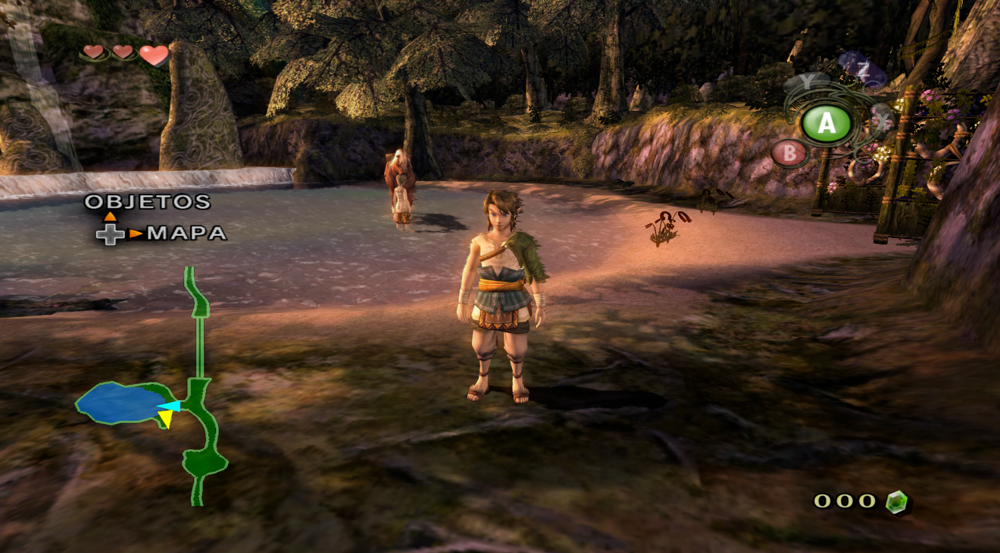

Reference D93 image from Dolphin emulator with NTSC-J ARIB TR-95 colour correction option selected: 

Most noticable is the wave and waterfall section in the background. 


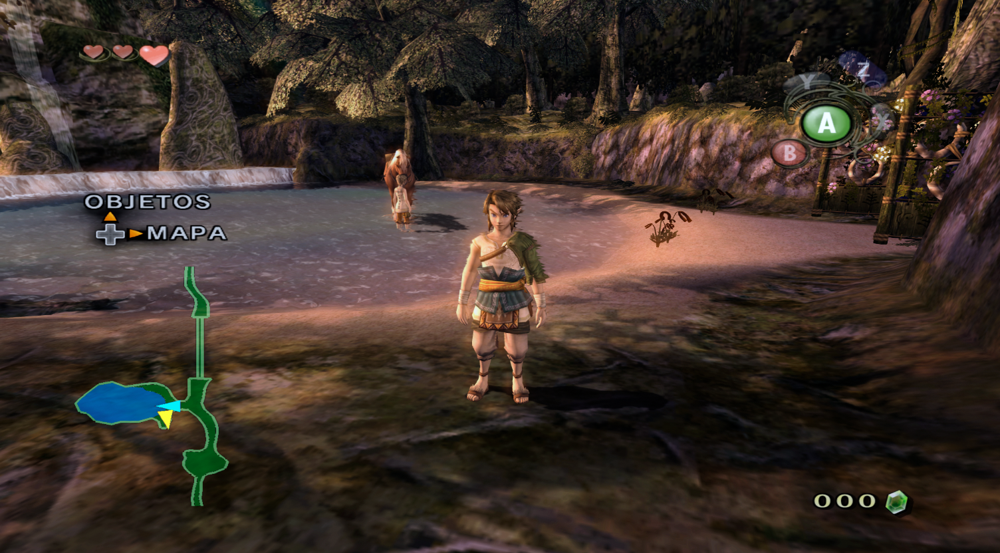

If our maths is correct, the following should look very similar to the reference D93 image from Dolphin: 

Calculated D93 image using the maths in this notebook: 

Using sRGB_D93 input matrix: 


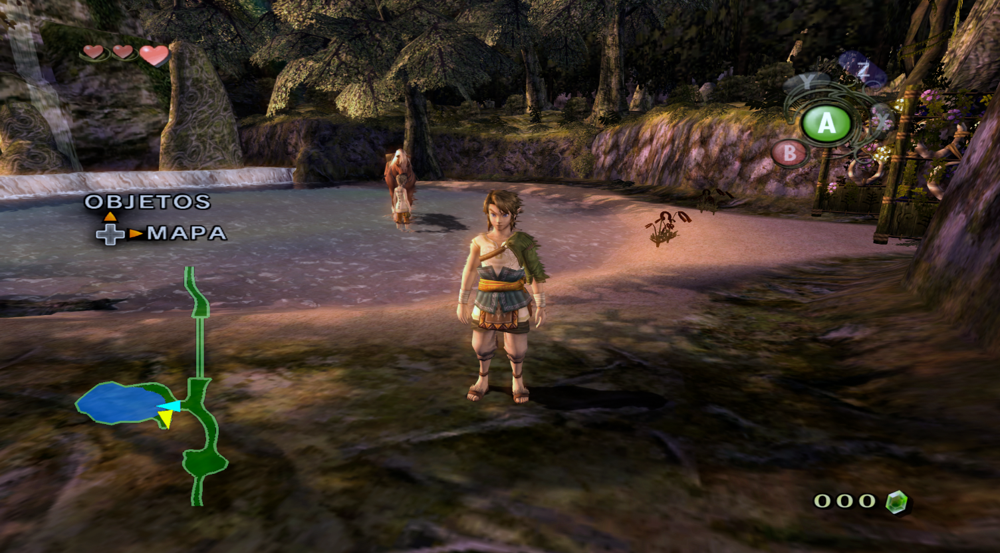

Using Bradford chromatic adaptation: 


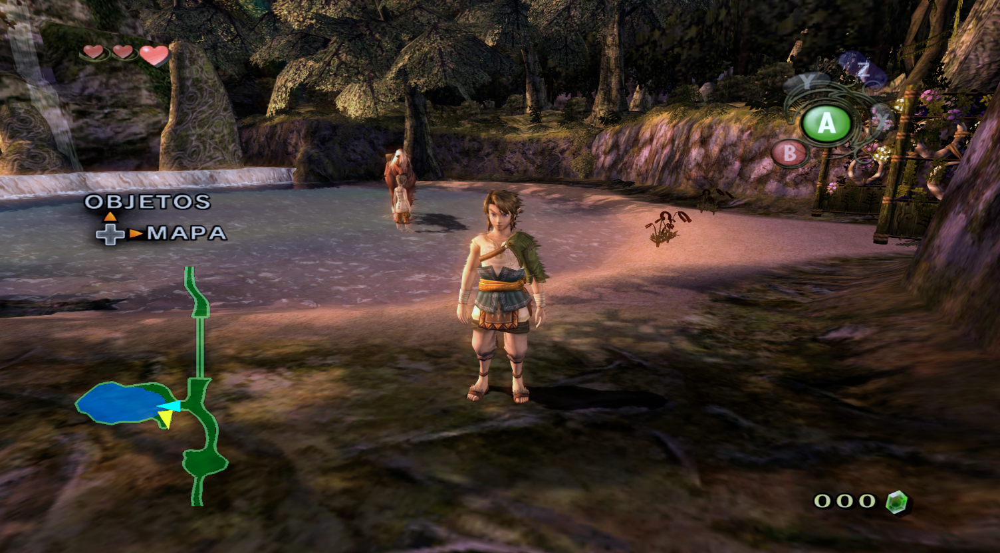

In [14]:
print('Reference images are from https://github.com/dolphin-emu/dolphin/pull/11888 \n')

print("Reference D65 image from Dolphin emulator:")
display(D65_ref)

print("Reference D93 image from Dolphin emulator with NTSC-J ARIB TR-95 colour correction option selected: \n")
print("Most noticable is the wave and waterfall section in the background. ")
display(D93_ref)

print("If our maths is correct, the following should look very similar to the reference D93 image from Dolphin: \n")
print("Calculated D93 image using the maths in this notebook: \n")

print("Using sRGB_D93 input matrix: ")
out_tp_matrix_d93_xyz = Image.fromarray(D93_XYZ_out_array, mode="RGB")
display(out_tp_matrix_d93_xyz)
out_tp_matrix_d93_xyz.save("out_tp_matrix_d93_xyz.png")

print("Using Bradford chromatic adaptation: ")
display(Image.fromarray(D93_Bradford_out_array, mode="RGB"))



Difference images, scaled by 10: 

Ref D65 image vs sRGB_D93 input matrix scaled:


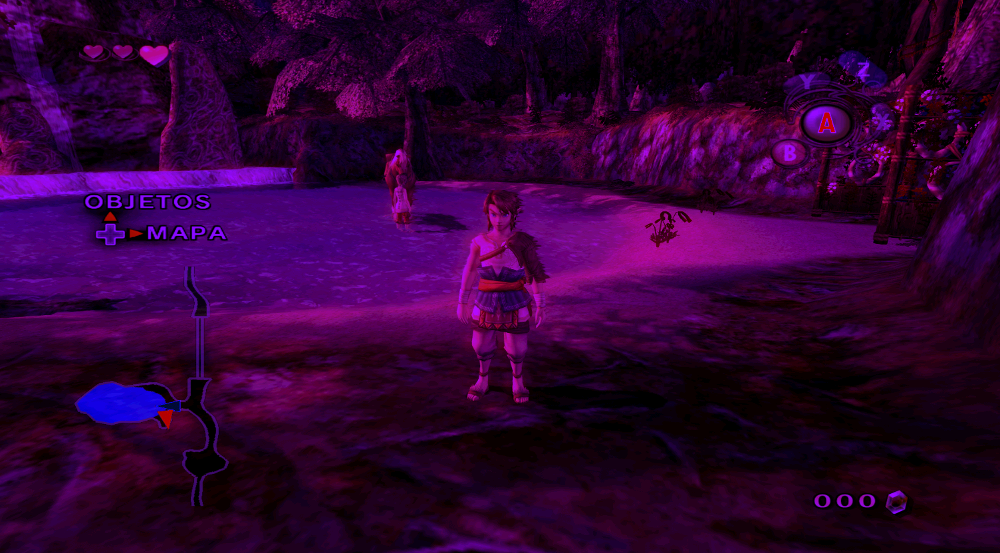

Ref D65 image vs D93 Bradford scaled:


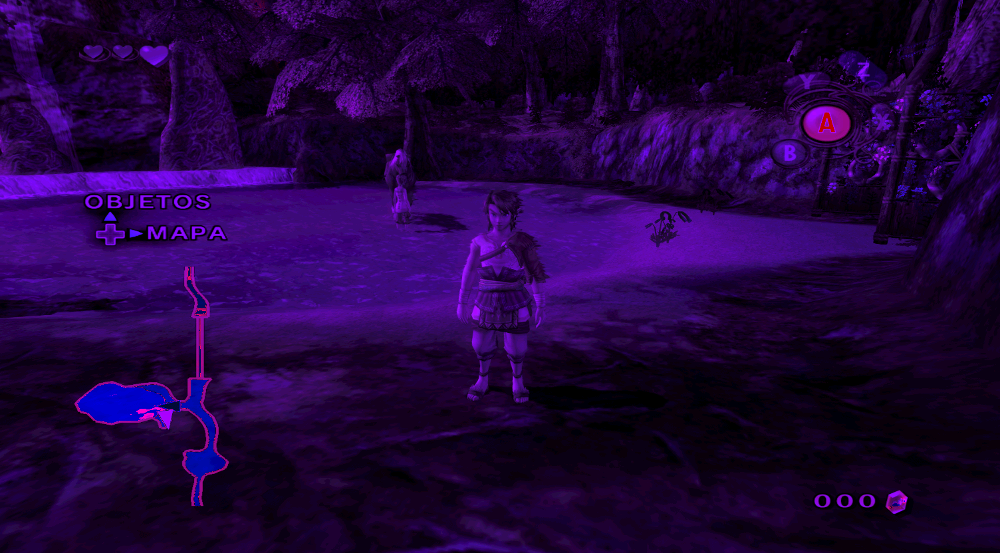

D93 sRGB_D93 input matrix scaled vs D93 Bradford scaled:


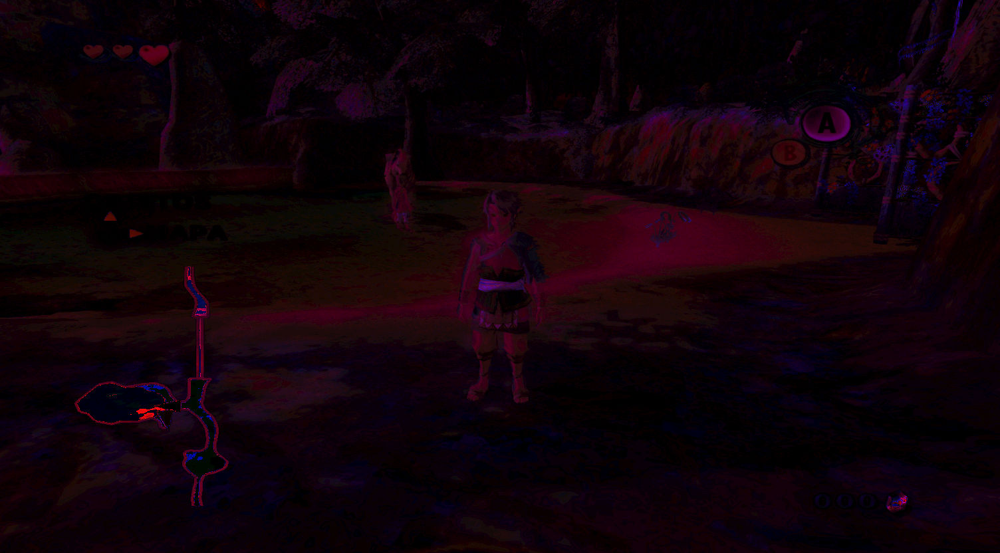

In [15]:
print("Difference images, scaled by 10: \n")

print("Ref D65 image vs sRGB_D93 input matrix scaled:")
out_tp_ca_diff_65ref_93matrix = Image.fromarray(diff_D65ref_D93XYZ, mode="RGB")
display(out_tp_ca_diff_65ref_93matrix)
out_tp_ca_diff_65ref_93matrix.save("out_tp_ca_diff_65ref_93matrix.png")

print("Ref D65 image vs D93 Bradford scaled:")
display(Image.fromarray(diff_D65ref_D93Bradford, mode="RGB"))

print("D93 sRGB_D93 input matrix scaled vs D93 Bradford scaled:")
out_tp_ca_diff_93matrix_93bradford = Image.fromarray(diff_D93XYZ_D93Bradford, mode="RGB")
display(out_tp_ca_diff_93matrix_93bradford)
out_tp_ca_diff_93matrix_93bradford.save("out_tp_ca_diff_93matrix_93bradford.png")
